## Step 15: Reanalysis of Cluster 2 from the human single-nucleus RNA-seq data

In this step, we examine the contributions of empty droplets, low quality outlier droplets, and doublets to the cluster Lee et al labeled as memory astrocytes in the human single-nucleus RNA-seq data from [Absinta et al 2021 (PMID: 34497421)](https://pubmed.ncbi.nlm.nih.gov/34497421/) and [Schirmer et al 2019 (PMID: 31316211)](https://pubmed.ncbi.nlm.nih.gov/31316211/).

We began by running CellBender ([Fleming et al 2023, PMID: 37550580](https://pubmed.ncbi.nlm.nih.gov/37550580/)) to identify which droplets correspond to empty/ambient RNA filled droplets and to remove ambient RNA contamination from nucleus-containing droplets. 

The CellBender code was run on a Linux HPC system using the SLURM scheduler. We include two scripts in the cells below; however this notebook will not run this step as CellBender requires a GPU for efficient inference. This code requires our Cell Ranger output files from Step 13 as input (specifically, the `raw_feature_bc_matrix.h5` files for each sample). These scripts use the conda environment `cellbenderv3`, which can be installed from the `cellbenderv3.yml` file in the `code/environments` directory.

If you wish to obtain the .h5 files produced from our Cell Ranger run, please email `michael.odea@nyulangone.org` and `shane.liddelow@nyulangone.org`. We will be happy to arrange transfer of these files to you.

```bash
#!/bin/bash
#SBATCH --partition=gpu4_short,gpu8_short,gpu4_medium,gpu8_medium # partition on which to run
#SBATCH --job-name=absinta_cellbender # name
#SBATCH --mail-type=ALL #Mail events (NONE, BEGIN, END, FAIL, ALL)
#SBATCH --ntasks=1 #Run on # of CPUs
#SBATCH --mem=64G #Job memory request ##max 128GB
#SBATCH --gres=gpu:1
#SBATCH --time=12:00:00 #Time limit hrs:min:sec
#SBATCH --output=./cellbender_%a.log #Standard output and error log
#SBATCH --no-kill
#SBATCH --array=0-19

source /.../anaconda3/bin/activate cellbenderv3

cd ./inputs/absinta/CellRanger

mapfile -t samples < absinta_samples.txt

mkdir -p "../cellbender/""${samples[$SLURM_ARRAY_TASK_ID]}"
cd "../cellbender/""${samples[$SLURM_ARRAY_TASK_ID]}"

cellbender remove-background \
	--input "../../CellRanger/""${samples[$SLURM_ARRAY_TASK_ID]}""/outs/raw_feature_bc_matrix.h5" \
	--output "./""${samples[$SLURM_ARRAY_TASK_ID]}""_output.h5" \
	--cuda \
	--learning-rate 0.000005 \
	--fpr 0.05
```

```bash
#!/bin/bash
#SBATCH --partition=gpu4_short,gpu8_short,gpu4_medium,gpu8_medium # partition on which to run
#SBATCH --job-name=schirmer_cellbender # name
#SBATCH --mail-type=ALL #Mail events (NONE, BEGIN, END, FAIL, ALL)
#SBATCH --ntasks=1 #Run on # of CPUs
#SBATCH --mem=64G #Job memory request ##max 128GB
#SBATCH --gres=gpu:1
#SBATCH --time=12:00:00 #Time limit hrs:min:sec
#SBATCH --output=./cellbender_%a.log #Standard output and error log
#SBATCH --no-kill
#SBATCH --array=0-20

source /.../anaconda3/bin/activate cellbenderv3

cd ./inputs/schirmer/CellRanger

mapfile -t samples < schirmer_samples.txt

mkdir -p "../cellbender/""${samples[$SLURM_ARRAY_TASK_ID]}"
cd "../""${samples[$SLURM_ARRAY_TASK_ID]}"

cellbender remove-background \
	--input "../../CellRanger/""${samples[$SLURM_ARRAY_TASK_ID]}""/outs/raw_feature_bc_matrix.h5" \
	--output "./""${samples[$SLURM_ARRAY_TASK_ID]}""_output.h5" \
	--cuda \
	--learning-rate 0.000005 \
	--fpr 0.05
```

The following analysis steps will require the CellBender output files, specifically the output .h5 files. We have provided our output files in the Zenodo repository which we downloaded in the earlier Step 1 script.

In [1]:
library(Seurat)
library(readxl)
library(ggplot2)
library(ggpubr)
library(ggsci)
library(dplyr)
library(tidyr)
library(viridis)
library(presto)
library(orthogene)
library(ggrepel)
library(rhdf5)
library(Matrix)
library(svglite)
library(harmony)
library(SingleCellExperiment)
library(scater)
library(BiocParallel)
library(scDblFinder)
library(cowplot)
library(ggrastr)
library(hdf5r)
library(DropletQC)
setwd('..') # setting working directory to 'EpiMemAstros' folder, adjust as needed

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite

Loading required package: Rcpp

Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The fol

First, let's read in our Seurat objects from the previous steps.

In [2]:
human <- readRDS('outputs/combined_human_seurat_object.rds')
absinta = readRDS('outputs/absinta_seurat_object.rds')
schirmer = readRDS('outputs/schirmer_seurat_object.rds')

Next we read the CellBender corrected count matrices for the Absinta samples into a new Seurat object. Much of the code here is adapted from the [`scCustomize` R package](https://samuel-marsh.github.io/scCustomize/index.html). 

In [3]:
cb_absinta <- NULL

absinta_geo_key = read.table('inputs/zenodo/absinta_GEO_key.csv', sep=',', header = TRUE)

for(x in 1:20){
    
    geo_ident = absinta_geo_key %>% filter(Sample == x) %>% .$GEO_ident
    
    infile = H5File$new(filename = paste0('inputs/zenodo/absinta/cellbender/', geo_ident, '_output_filtered.h5'), mode = "r")
    # replace the above line with the below commented out one if you ran the CellBender script yourself and are providing your own .h5 output files
    #infile = H5File$new(filename = paste0('inputs/absinta/cellbender/', geo_ident, '/', geo_ident, '_output_filtered.h5'), mode = "r")
    
    counts <- infile[["matrix/data"]]
    indices <- infile[["matrix/indices"]]
    indptr <- infile[["matrix/indptr"]]
    shp <- infile[['matrix/shape']]
    features <- infile[["matrix/features/name"]]
    barcodes <- infile[['matrix/barcodes']]

    sparse.mat <- sparseMatrix(
        i = indices[] + 1,
        p = indptr[],
        x = as.numeric(x = counts[]),
        dims = shp[],
        repr="T"
        )

    features <- make.unique(names = features[])
    
    rownames(sparse.mat) <- features
    colnames(sparse.mat) <- barcodes[]
    sparse.mat <- as.sparse(sparse.mat)

    infile$close_all()

    colnames(sparse.mat) <- paste0(gsub("(.*)-(.*)", "\\1", colnames(sparse.mat)), '-', x)
    
    tmp = CreateSeuratObject(counts = sparse.mat)
    
    tmp$sample <- absinta_geo_key %>% filter(Sample == x) %>% .$NBB
    tmp$Diagnosis <- absinta_geo_key %>% filter(Sample == x) %>% .$Diagnosis
    tmp$Tissue <- absinta_geo_key %>% filter(Sample == x) %>% .$Tissue
    tmp$Block <- absinta_geo_key %>% filter(Sample == x) %>% .$Block
    tmp$Dataset <- "Absinta"
    tmp$samplenumb <- x
    
    if(x == 1){
        cb_absinta <- tmp
    } else{
        cb_absinta <- merge(cb_absinta, tmp)
    }

}

cb_absinta <- JoinLayers(cb_absinta)

cb_absinta[["percent.mt"]] <- PercentageFeatureSet(object = cb_absinta, pattern = "^MT-")
cb_absinta[['percent.ribo']] <- PercentageFeatureSet(cb_absinta, pattern = '^RP[SL]')

cb_absinta

An object of class Seurat 
38606 features across 124796 samples within 1 assay 
Active assay: RNA (38606 features, 0 variable features)
 1 layer present: counts

This CellBender-derived Seurat object contains many more nuclei than the Absinta portion of the Seurat object provided by Lee et al because it includes all nuclei/droplet barcodes from the original dataset, not just those originally labeled (or mislabeled) as astrocytes. Before we subset this object to include only those barcodes, we first use the `DropletQC` results to identify nucleus-free droplets based the nuclear fraction statistic we calculated in Step 13. 

To do this, we load the nuclear fraction data frame we provided to you in the Zenodo repository. If you ran the nuclear fraction calculation yourself in Step 13, you can comment out the below code line and un-comment the following line to load your own data frame.

In [4]:
nf_df_absinta <- readRDS('inputs/zenodo/absinta_nuclear_fraction_df.rds')
#nf_df_absinta <- readRDS('outputs/absinta_nuclear_fraction_df.rds')

Next, we add this nuclear fraction statistic to the CellBender derived Seurat object, and we add an additional metadata column corresponding to log10 transformed UMI counts, for visualization of UMI counts versus nuclear fraction. 

In [5]:
cb_absinta$nuclear_fraction <- nf_df_absinta[colnames(cb_absinta),]
cb_absinta$log10_nCount_RNA <- log10(cb_absinta$nCount_RNA)

By visualizing these two metrics together in a scatter plot, we can see that while the majority of nuclei/droplets have a high nuclear fraction (as expected given this is single-nucleus RNA-seq), a small subset have very low nuclear fractions. These are likely to represent empty droplets miscalled by CellBender as nucleus-containing even after ambient RNA correction. 

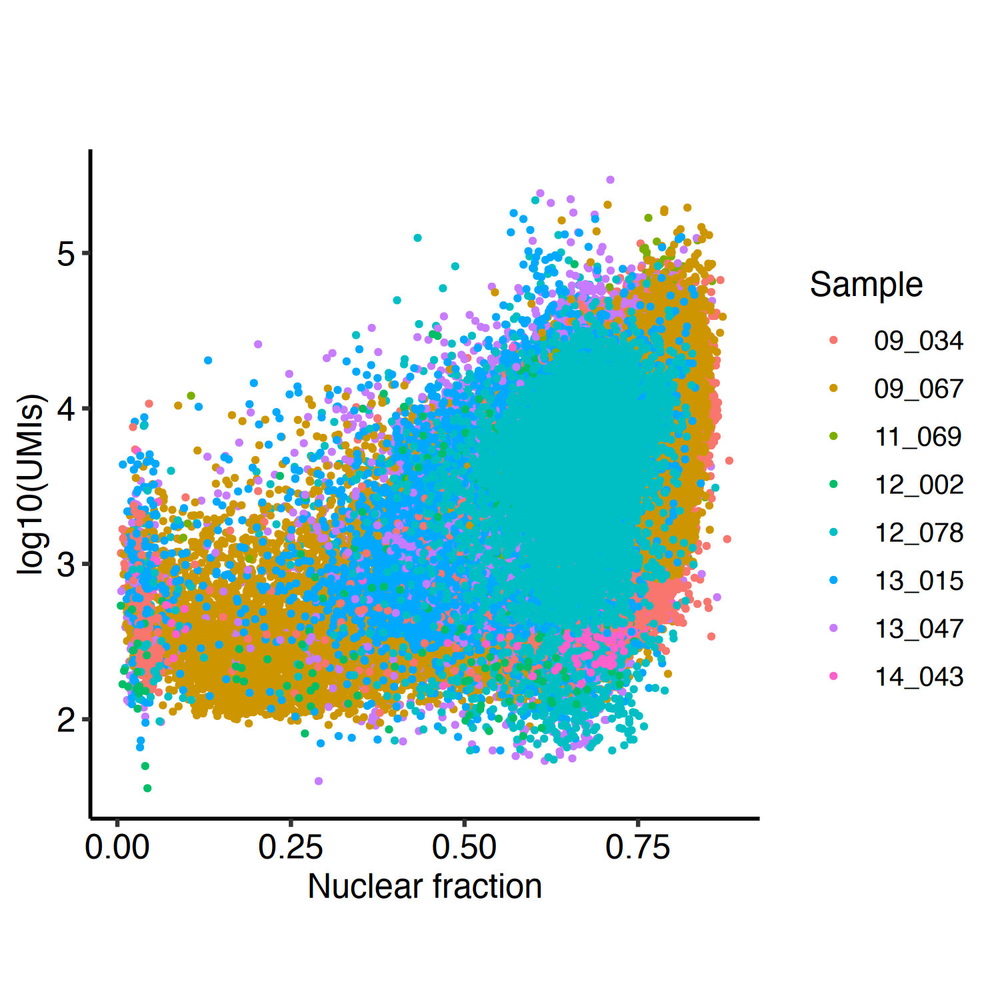

In [6]:
options(repr.plot.width=5, repr.plot.height=5, repr.plot.res = 300)
FeatureScatter(cb_absinta, feature1 = 'nuclear_fraction', feature2='log10_nCount_RNA', group.by = 'sample', 
              pt.size = 0.5, raster = FALSE) + 
     labs(title = '', x = "Nuclear fraction", y = "log10(UMIs)", color = 'Sample') + 
    theme_pubr() + theme(aspect.ratio = 1, legend.position = 'right')

Using the `identify_empty_drops` function from the `DropletQC` package, we can identify the barcodes most likely to represent empty droplets.

Warning message in ggplot2::geom_segment(ggplot2::aes(x = l1$x_start, y = l1$y_start, :
“All aesthetics have length 1, but the data has 124796 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”
Warning message in ggplot2::geom_segment(ggplot2::aes(x = l2$x_start, y = l2$y_start, :
“All aesthetics have length 1, but the data has 124796 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”
Warning message in ggplot2::geom_segment(ggplot2::aes(x = l3$x_start, y = l3$y_start, :
“All aesthetics have length 1, but the data has 124796 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”


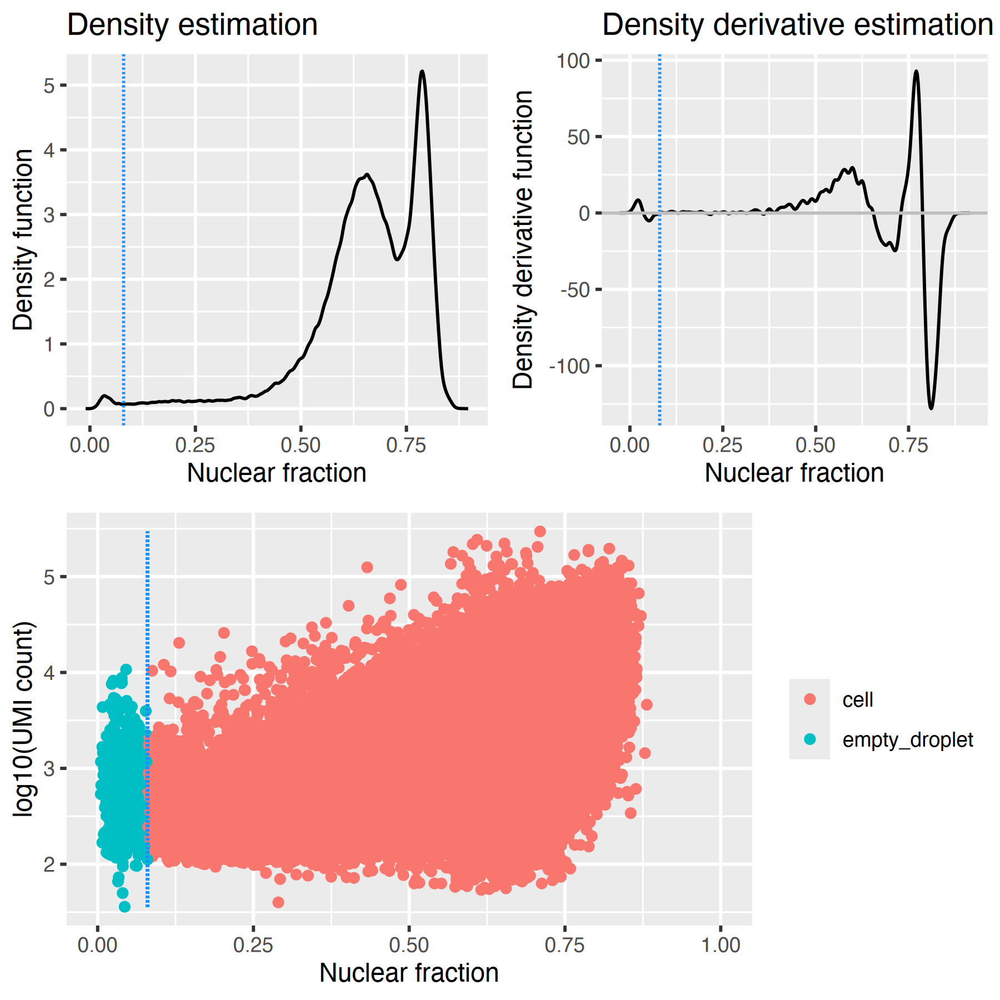

In [7]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res = 300)

absinta_empty_df = data.frame('nfrac' = cb_absinta$nuclear_fraction, 'nUMI' = cb_absinta$nCount_RNA)
absinta_empty_df = identify_empty_drops(absinta_empty_df, nf_rescue = 0.35, include_plot = TRUE)
cb_absinta$dropletqc <- absinta_empty_df$cell_status

After excluding empty droplets from the Absinta dataset, we next remove nuclei which are extreme outliers along three common quality control (QC) metrics: number of UMIs, number of genes detected, and percentage of UMIs mapping to the mitochondrial genome.

We use the `isOutlier` function from the `scater` package to remove nuclei which exceed 5 median absolute deviations from the within sample median for each of these statistics. This threshold has been recommended by a recent "best practices" review of single-cell analysis methods and is considered a lenient QC threshold ([Heumos et al 2023, PMID: 37002403](https://pubmed.ncbi.nlm.nih.gov/37002403/); [Germain et al 2020, PMID: 32873325](https://pubmed.ncbi.nlm.nih.gov/32873325/)).

In [8]:
sce <- as.SingleCellExperiment(cb_absinta[,WhichCells(cb_absinta, expression = `dropletqc` == 'cell')])
sce$samplenumb <- factor(sce$samplenumb, levels = c('1', '2', '3' ,'4' ,'5' ,'6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17','18','19', '20'))

Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”


In [9]:
sce$umi_outlier <- isOutlier(sce$nCount_RNA, nmads = 5, type = 'both', log = TRUE, batch = sce$samplenumb)
sce$gene_outlier <- isOutlier(sce$nFeature_RNA, nmads = 5, type = 'both', log = TRUE, batch = sce$samplenumb)
sce$mt_outlier <- isOutlier(sce$percent.mt, nmads = 5, type = 'higher', log = FALSE, batch = sce$samplenumb)

If we examine each of these QC metrics across the samples and highlight the nuclei classified as outliers, we can see that this thresholding results in the removal of a small number of nuclei with extreme large or small UMI counts and those with very low numbers of genes detected.

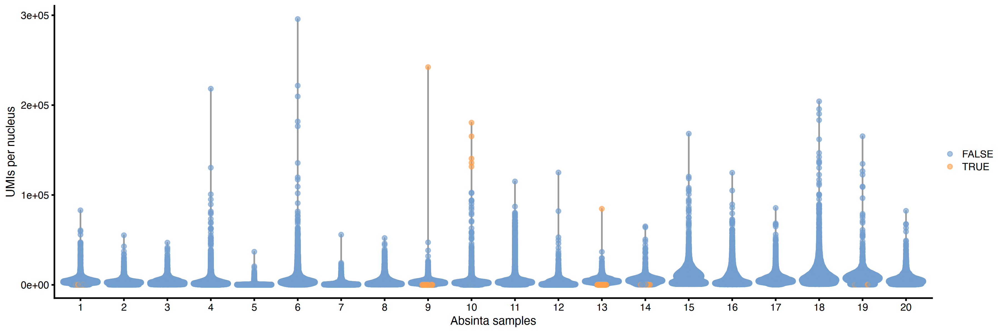

In [10]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="nCount_RNA", color_by = I(sce$umi_outlier)) + labs(x = "Absinta samples", y = "UMIs per nucleus", color = "Outlier")

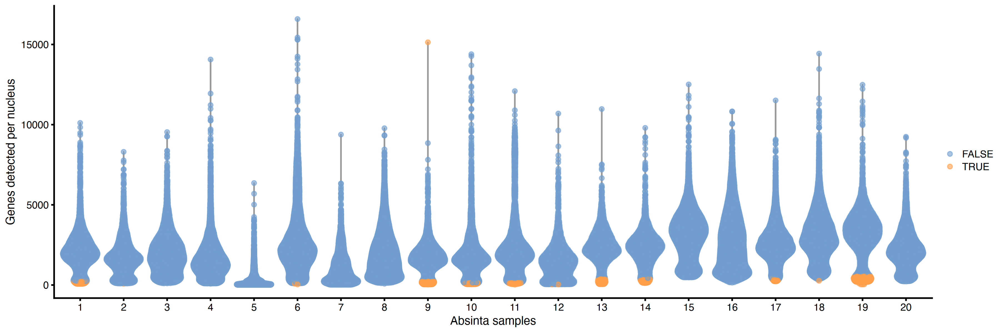

In [11]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="nFeature_RNA", color_by = I(sce$gene_outlier)) + labs(x = "Absinta samples", y = "Genes detected per nucleus", color = "Outlier")

The thresholding along mitochondrial UMI percentage results in removal of a larger number of nuclei with very high mitochondrial percentages. Because this is single-nucleus RNA-seq, we would expect very low percentages here in bona fide nuclei, and this thresholding seems reasonable.

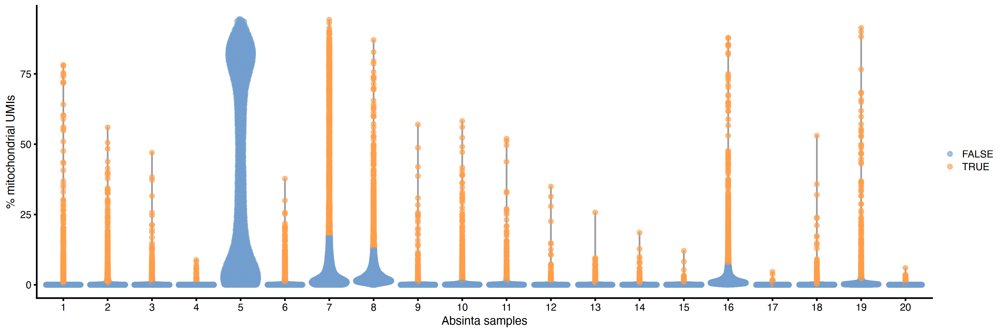

In [12]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="percent.mt", color_by = I(sce$mt_outlier)) + labs(x = "Absinta samples", y = "% mitochondrial UMIs", color = "Outlier")

One sample, sample 5, appears to be an extreme outlier, with mitochondrial UMI percentages reaching 75+% in a large number of nuclei. Because our thresholding is based on sample medians, outlier nuclei here were not excluded based on this metric. However, proper nuclei in single-nucleus RNA-seq should never approach mitchondrial UMI percentages this high (even whole cell single-cell RNA-seq routinely yields percentages < 20% in healthy cells). To remove low quality nuclei in this outlier sample, we thus chose to exclude any nuclei from sample 5 with mitchondrial percentages higher than the maximum percentage among the other samples after the 5 MAD filtering step.

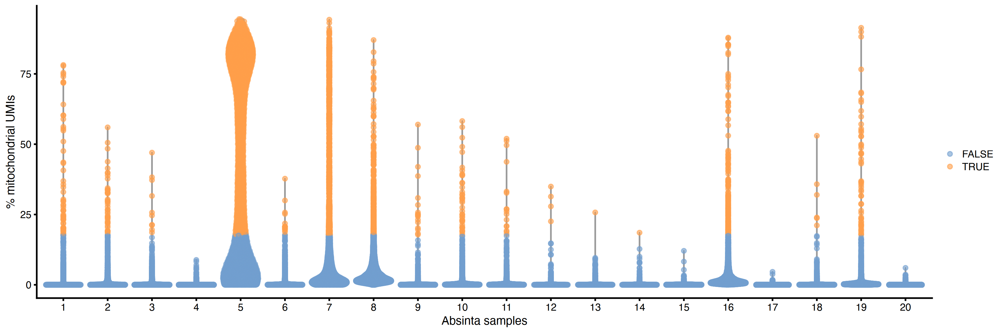

In [13]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
sce$mt_threshold_outlier <- FALSE
sce[,sce$percent.mt > max(sce[,(sce$mt_outlier == FALSE) & (sce$samplenumb != '5')]$percent.mt)]$mt_threshold_outlier <- TRUE
plotColData(sce, x="samplenumb", y="percent.mt", color_by = I(sce$mt_threshold_outlier)) + labs(x = "Absinta samples", y = "% mitochondrial UMIs", color = "Outlier")

We'll next create a data frame storing the outlier classification for each barcode along the above metrics, and we'll classify each nucleus as an outlier if it meets the outlier threshold for at least 1 QC metric.

In [14]:
absinta_qc = data.frame('umi_outlier'=sce$umi_outlier, 'gene_outlier'=sce$gene_outlier, 
                        'mt_outlier'=sce$mt_outlier, 'mt_thresh_outlier'=sce$mt_threshold_outlier)
rownames(absinta_qc) <- colnames(sce)
sce$is.outlier <- rowSums(absinta_qc)>0
absinta_qc$is.outlier <- rowSums(absinta_qc)>0

Now let's check the number of outliers identified along each sample in the Absinta dataset:

In [15]:
table(sce$is.outlier, sce$samplenumb)

       
            1     2     3     4     5     6     7     8     9    10    11    12
  FALSE  3887  1978  4243  4901  2000  5614  3221 11857  3756  4316  5095  2256
  TRUE   1761  1232   903  2319  2610  1009   705   711   525   576   599   249
       
           13    14    15    16    17    18    19    20
  FALSE  1824  2373  7506  8370  7785  8885  3403  5708
  TRUE    244   263   299   695  7695   906   513   982

Next, we exclude the outlier nuclei and check for doublets/multiplets among the remaining nuclei using [`scDblFinder` (Germain et al 2021, PMID: 35814628)](https://pubmed.ncbi.nlm.nih.gov/35814628/).

In [16]:
sce <- sce[,sce$is.outlier == FALSE]
sce <- scDblFinder(sce, samples = 'samplenumb', BPPARAM=MulticoreParam(4))

Warning message in .checkSCE(sce):
“Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out”
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call




Let's check the number of droplets identified as doublets/multiplets across each sample:

In [17]:
table(sce$scDblFinder.class, sce$samplenumb)

         
              1     2     3     4     5     6     7     8     9    10    11
  singlet  3616  1885  3952  4583  1922  5176  3041 10255  3504  4080  4740
  doublet   271    93   291   318    78   438   180  1602   252   236   355
         
             12    13    14    15    16    17    18    19    20
  singlet  2168  1740  2266  6726  7504  7183  7789  3181  5204
  doublet    88    84   107   780   866   602  1096   222   504

Then we'll add the outlier and doublet classification information to the Seurat object's metadata.

In [18]:
absinta_doublet_df = as.data.frame(colData(sce)[,c('scDblFinder.class')])
colnames(absinta_doublet_df) <- c('scDblFinder.class')
rownames(absinta_doublet_df) <- colnames(sce)

absinta_qc = merge(absinta_qc, absinta_doublet_df, by =  0, all = TRUE)
rownames(absinta_qc) <- absinta_qc$Row.names

cb_absinta_metadata_df = cb_absinta@meta.data
cb_absinta_metadata_df <- merge(cb_absinta_metadata_df, absinta_qc, by=0, all = TRUE)
rownames(cb_absinta_metadata_df) <- cb_absinta_metadata_df$Row.names

cb_absinta@meta.data <- cb_absinta_metadata_df[colnames(cb_absinta),]

Next, we repeat this process for the Schirmer dataset. First loading the CellBender corrected count matrices:

In [19]:
cb_schirmer <- NULL

schirmer_key = readRDS('outputs/schirmer_key.rds')

for(x in unique(schirmer_key$Original_sample_name)){
    
    sample_ident = schirmer_key %>% filter(Original_sample_name == x) %>% .$sample
    
    infile = hdf5r::H5File$new(filename = paste0('inputs/zenodo/schirmer/cellbender/', x, '_10x_output_filtered.h5'), mode = "r")
    # replace the above line with the below commented out one if you ran the CellBender script yourself and are providing your own .h5 output files
    #infile = hdf5r::H5File$new(filename = paste0('inputs/schirmer/cellbender/', x, '_10x/', x, '_10x_output_filtered.h5'), mode = "r")
    
    counts <- infile[["matrix/data"]]
    indices <- infile[["matrix/indices"]]
    indptr <- infile[["matrix/indptr"]]
    shp <- infile[['matrix/shape']]
    features <- infile[["matrix/features/name"]]
    barcodes <- infile[['matrix/barcodes']]

    sparse.mat <- sparseMatrix(
        i = indices[] + 1,
        p = indptr[],
        x = as.numeric(x = counts[]),
        dims = shp[],
        repr="T"
        )

    features <- make.unique(names = features[])
    
    rownames(sparse.mat) <- features
    colnames(sparse.mat) <- barcodes[]
    sparse.mat <- as.sparse(sparse.mat)

    infile$close_all()

    colnames(sparse.mat) <- paste0(colnames(sparse.mat), '_', sample_ident)
   
    tmp = CreateSeuratObject(counts = sparse.mat)
    
    tmp$sample <- sample_ident
    tmp$samplenumb <- sample_ident
    tmp$Diagnosis <- schirmer_key %>% filter(Original_sample_name == x) %>% .$Diagnosis
    tmp$Tissue <- schirmer_key %>% filter(Original_sample_name == x) %>% .$pathology
    tmp$Dataset <- "Schirmer"
    
    if(x == "C1"){
        cb_schirmer <- tmp
    } else{
        cb_schirmer <- merge(cb_schirmer, tmp)
    }
    
}

cb_schirmer <- JoinLayers(cb_schirmer)

cb_schirmer[["percent.mt"]] <- PercentageFeatureSet(object = cb_schirmer, pattern = "^MT-")
cb_schirmer[['percent.ribo']] <- PercentageFeatureSet(cb_schirmer, pattern = '^RP[SL]')

cb_schirmer

An object of class Seurat 
38606 features across 85681 samples within 1 assay 
Active assay: RNA (38606 features, 0 variable features)
 1 layer present: counts

Next, we add this nuclear fraction statistic to the CellBender derived Seurat object.

In [20]:
nf_df_schirmer <- readRDS('inputs/zenodo/schirmer_nuclear_fraction_df.rds')
#nf_df_schirmer <- readRDS('outputs/schirmer_nuclear_fraction_df.rds')
cb_schirmer$nuclear_fraction <- nf_df_schirmer[colnames(cb_schirmer),]
cb_schirmer$log10_nCount_RNA <- log10(cb_schirmer$nCount_RNA)

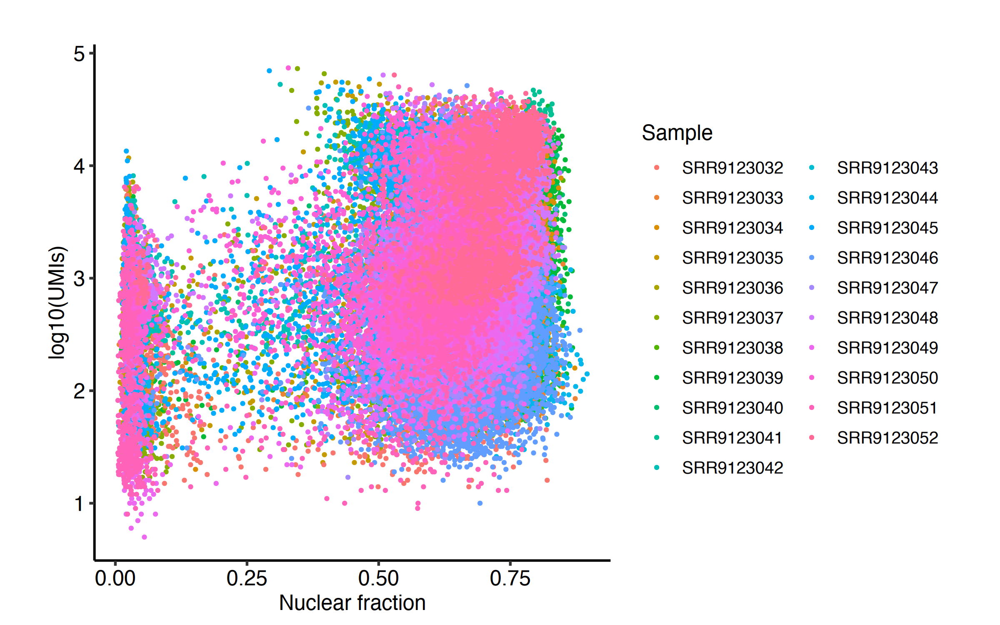

In [21]:
options(repr.plot.width=8, repr.plot.height=5, repr.plot.res = 300)
FeatureScatter(cb_schirmer, feature1 = 'nuclear_fraction', feature2='log10_nCount_RNA', group.by = 'sample', 
              pt.size = 0.5, raster = FALSE) + 
     labs(title = '', x = "Nuclear fraction", y = "log10(UMIs)", color = 'Sample') + 
    theme_pubr() + theme(aspect.ratio = 1, legend.position = 'right')

And again use the `identify_empty_drops` function from the `DropletQC` package to identify the barcodes most likely to represent empty droplets.

Warning message in ggplot2::geom_segment(ggplot2::aes(x = l1$x_start, y = l1$y_start, :
“All aesthetics have length 1, but the data has 85681 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”
Warning message in ggplot2::geom_segment(ggplot2::aes(x = l2$x_start, y = l2$y_start, :
“All aesthetics have length 1, but the data has 85681 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”
Warning message in ggplot2::geom_segment(ggplot2::aes(x = l3$x_start, y = l3$y_start, :
“All aesthetics have length 1, but the data has 85681 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing a single row.”


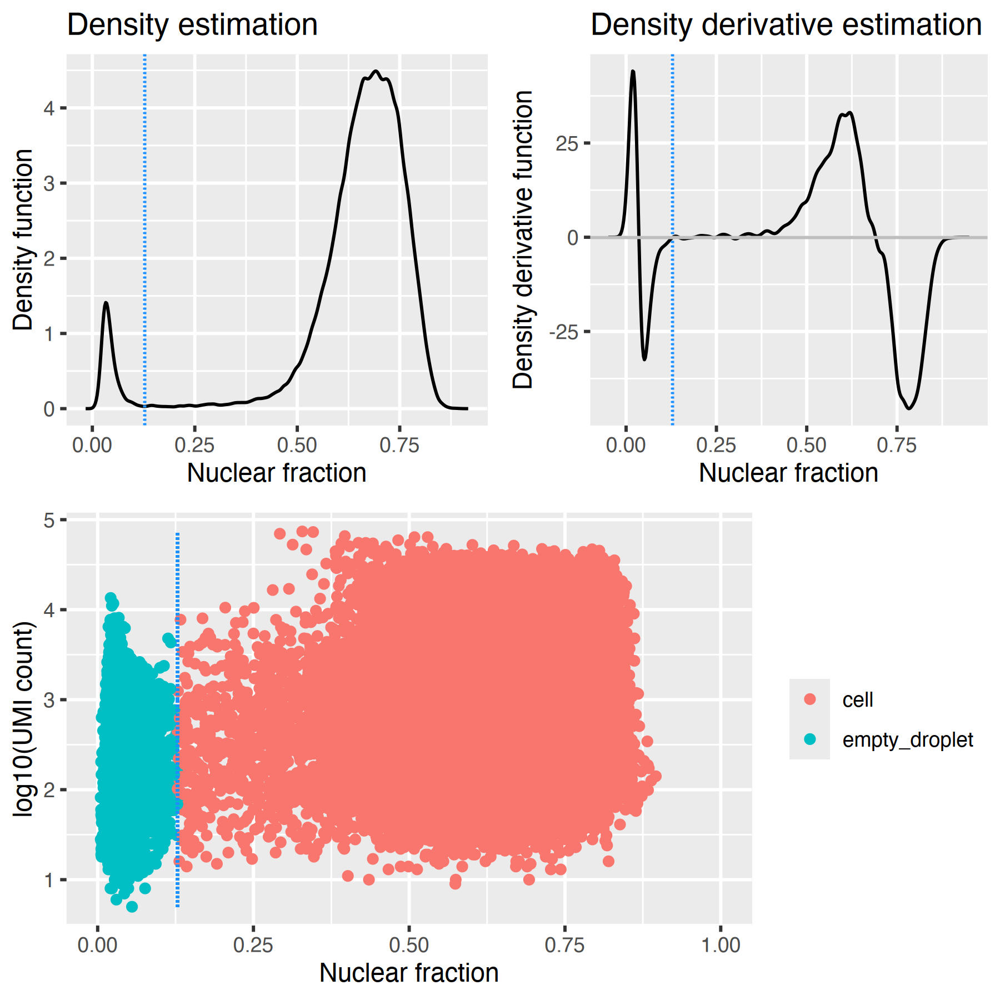

In [22]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res = 300)

schirmer_empty_df = data.frame('nfrac' = cb_schirmer$nuclear_fraction, 'nUMI' = cb_schirmer$nCount_RNA)
schirmer_empty_df = identify_empty_drops(schirmer_empty_df, nf_rescue = 0.35, include_plot = TRUE)
cb_schirmer$dropletqc <- schirmer_empty_df$cell_status

After excluding the empty droplets, we again use the `isOutlier` function from the `scater` package to remove nuclei which exceed 5 median absolute deviations from the within sample median for each of these statistics.

In [23]:
sce <- as.SingleCellExperiment(cb_schirmer[,WhichCells(cb_schirmer, expression = `dropletqc` == 'cell')])

Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”


In [24]:
sce$umi_outlier <- isOutlier(sce$nCount_RNA, nmads = 5, type = 'both', log = TRUE, batch = sce$samplenumb)
sce$gene_outlier <- isOutlier(sce$nFeature_RNA, nmads = 5, type = 'both', log = TRUE, batch = sce$samplenumb)
sce$mt_outlier <- isOutlier(sce$percent.mt, nmads = 5, type = 'higher', log = FALSE, batch = sce$samplenumb)

If we examine each of these QC metrics across the samples and highlight the nuclei classified as outliers, we can see that the UMI and genes detected thresholding does not result in any nuclei classified as outliers; however, the mitochondrial percentage thresholding does identify a small number of nuclei in each sample as outliers.

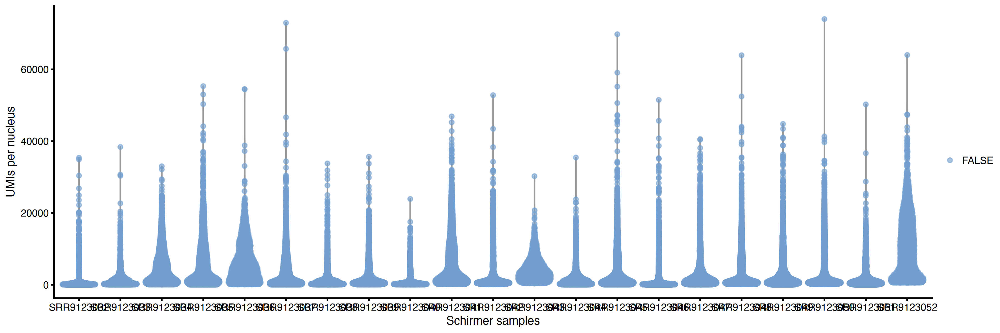

In [25]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="nCount_RNA", color_by = I(sce$umi_outlier)) + labs(x = "Schirmer samples", y = "UMIs per nucleus", color = "Outlier")

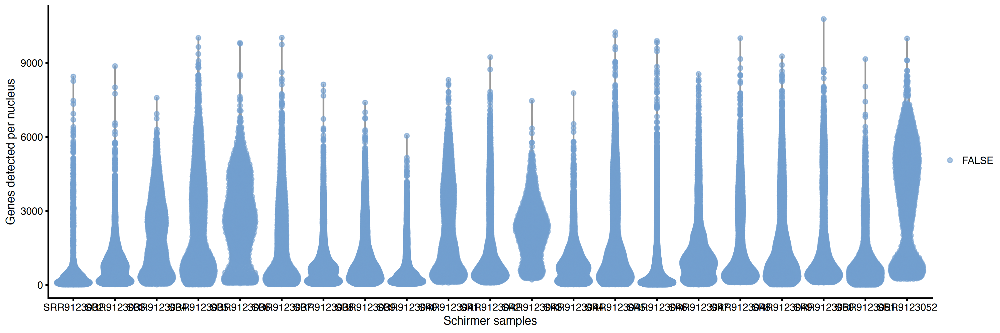

In [26]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="nFeature_RNA", color_by = I(sce$gene_outlier)) + labs(x = "Schirmer samples", y = "Genes detected per nucleus", color = "Outlier")

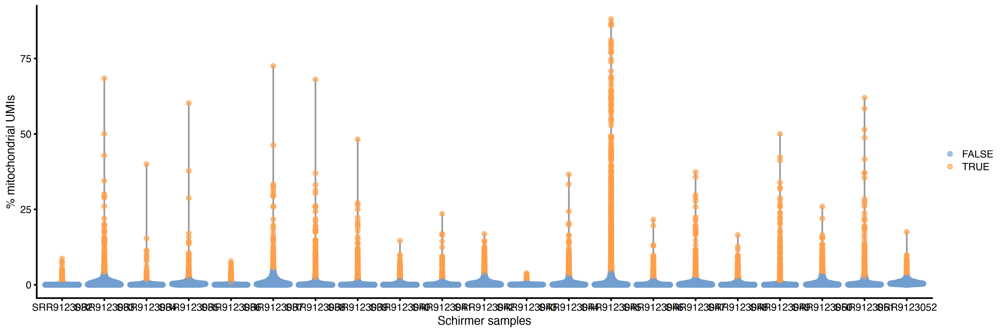

In [27]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res = 300)
plotColData(sce, x="samplenumb", y="percent.mt", color_by = I(sce$mt_outlier)) + labs(x = "Schirmer samples", y = "% mitochondrial UMIs", color = "Outlier")

Again we'll classify each nucleus as an outlier if it meets the outlier threshold for at least 1 QC metric.

In [28]:
schirmer_qc = data.frame('umi_outlier'=sce$umi_outlier, 'gene_outlier'=sce$gene_outlier, 
                        'mt_outlier'=sce$mt_outlier)
rownames(schirmer_qc) <- colnames(sce)
sce$is.outlier <- rowSums(schirmer_qc)>0
schirmer_qc$is.outlier <- rowSums(schirmer_qc)>0

Now let's check the number of outliers identified along each sample in the Schirmer dataset:

In [29]:
table(sce$is.outlier, sce$samplenumb)

       
        SRR9123032 SRR9123033 SRR9123034 SRR9123035 SRR9123036 SRR9123037
  FALSE       1168       6149       3012       2125       1124       2267
  TRUE        1037        236         78         97        164         87
       
        SRR9123038 SRR9123039 SRR9123040 SRR9123041 SRR9123042 SRR9123043
  FALSE       5637       4518       4639       2997       3771       1021
  TRUE         486        590        242        131        201         51
       
        SRR9123044 SRR9123045 SRR9123046 SRR9123047 SRR9123048 SRR9123049
  FALSE       3776       4504       8926       4256       4003       4332
  TRUE         240        647        380        198        298        433
       
        SRR9123050 SRR9123051 SRR9123052
  FALSE       3242       1894       1728
  TRUE         197        240         49

Next, we exclude the outlier nuclei and check for doublets/multiplets among the remaining nuclei using `scDblFinder`.

In [30]:
sce <- sce[,sce$is.outlier == FALSE]
sce <- scDblFinder(sce, samples = 'samplenumb', BPPARAM=MulticoreParam(4))

Warning message in .checkSCE(sce):
“Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out”
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 

Let's check the number of droplets identified as doublets/multiplets across each sample:

In [31]:
table(sce$scDblFinder.class, sce$samplenumb)

         
          SRR9123032 SRR9123033 SRR9123034 SRR9123035 SRR9123036 SRR9123037
  singlet       1136       5647       2864       2038       1093       2173
  doublet         32        502        148         87         31         94
         
          SRR9123038 SRR9123039 SRR9123040 SRR9123041 SRR9123042 SRR9123043
  singlet       5223       4222       4357       2840       3524        985
  doublet        414        296        282        157        247         36
         
          SRR9123044 SRR9123045 SRR9123046 SRR9123047 SRR9123048 SRR9123049
  singlet       3542       4175       8099       3973       3747       4059
  doublet        234        329        827        283        256        273
         
          SRR9123050 SRR9123051 SRR9123052
  singlet       3061       1815       1659
  doublet        181         79         69

Finally, we'll add the outlier and doublet classification information to the Seurat object's metadata.

In [32]:
schirmer_doublet_df = as.data.frame(colData(sce)[,c('scDblFinder.class')])
colnames(schirmer_doublet_df) <- c('scDblFinder.class')
rownames(schirmer_doublet_df) <- colnames(sce)

schirmer_qc = merge(schirmer_qc, schirmer_doublet_df, by =  0, all = TRUE)
rownames(schirmer_qc) <- schirmer_qc$Row.names

cb_schirmer_metadata_df = cb_schirmer@meta.data
cb_schirmer_metadata_df <- merge(cb_schirmer_metadata_df, schirmer_qc, by=0, all = TRUE)
rownames(cb_schirmer_metadata_df) <- cb_schirmer_metadata_df$Row.names

cb_schirmer@meta.data <- cb_schirmer_metadata_df[colnames(cb_schirmer),]

Now we'll merge our two CellBender derived Seurat objects into a single object, and evalute the number of nuclei remaining in each of the clusters defined by Lee et al after using CellBender and DropletQC to remove empty droplets, after removing the QC outliers, and after removing the doublets.

In [33]:
cb_human = merge(cb_absinta, cb_schirmer)
cb_human <- JoinLayers(cb_human)
cb_human = cb_human[,colnames(human)]
cb_human$seurat_clusters = human$seurat_clusters

original_counts <- as.data.frame(table(human$seurat_clusters))$Freq
print('Number of nuclei per cluster in original dataset:')
print(table(human$seurat_clusters))

cb_human = cb_human[,WhichCells(cb_human, expression = `dropletqc` == 'cell')]
empty_counts <- original_counts - as.data.frame(table(cb_human$seurat_clusters))$Freq
print('Number of nuclei per cluster after empty droplet removal:')
print(table(cb_human$seurat_clusters))

outlier_counts <- as.data.frame(table(cb_human$seurat_clusters, cb_human$is.outlier))[7:12,]$Freq
cb_human = cb_human[, WhichCells(cb_human, expression = `is.outlier` == FALSE)]
print('Number of nuclei per cluster after empty droplet and outlier removal:')
print(table(cb_human$seurat_clusters))

doublet_counts = as.data.frame(table(cb_human$seurat_clusters, cb_human$scDblFinder.class))[1:6,]$Freq
cb_human = cb_human[, WhichCells(cb_human, expression = `scDblFinder.class` == 'singlet')]
print('Number of nuclei per cluster after empty droplet, outlier, and doublet removal:')
print(table(cb_human$seurat_clusters))

count_df = data.frame('cluster' = c('0', '1', '2', '3', '4', '5'), 
           'total' = original_counts,
           'Empty' = empty_counts,
            'Outlier' = outlier_counts,
            'Doublet' = doublet_counts) %>% mutate('Passed' = total - (Empty+Outlier+Doublet))

count_df = reshape2::melt(count_df[,c(1, 3:6)])

[1] "Number of nuclei per cluster in original dataset:"

   0    1    2    3    4    5 
6723 6218  964  882  856  633 
[1] "Number of nuclei per cluster after empty droplet removal:"

   0    1    2    3    4    5 
6271 5809  525  821  794  315 
[1] "Number of nuclei per cluster after empty droplet and outlier removal:"

   0    1    2    3    4    5 
5241 5623  315  706  672  242 
[1] "Number of nuclei per cluster after empty droplet, outlier, and doublet removal:"

   0    1    2    3    4    5 
5183 5600  292  695  156  195 


Using cluster as id variables



We can visualize this in a bar plot. Note that empty droplet detection, outlier identification, and doublet classification are performed serially, such that if a droplet is classified as empty it is not passed along for outlier detection and doublet detection, etc.

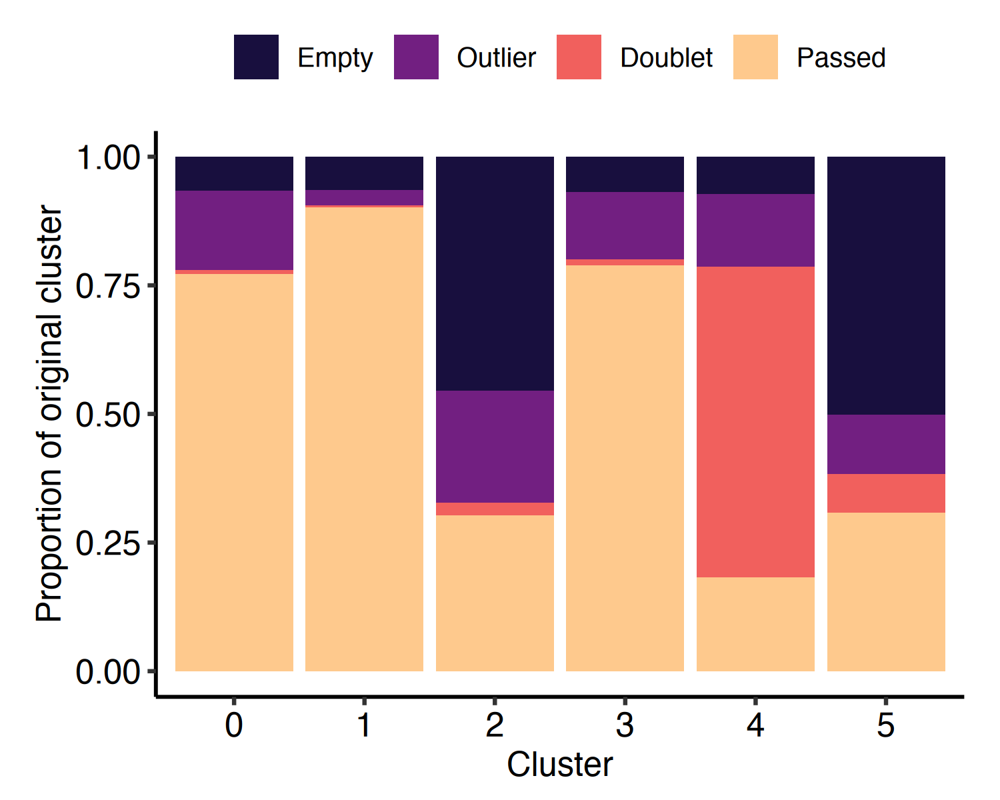

In [34]:
options(repr.plot.width=5, repr.plot.height=4, repr.plot.res = 300)
image = ggplot(count_df, aes(fill=variable, y=value, x=cluster)) + 
    geom_bar(position="fill", stat="identity") + 
    labs(y = 'Proportion of original cluster', fill = NULL, x = "Cluster") + 
    scale_fill_manual(values = viridis(10, option = 'magma')[c(2,4,7,9)]) + theme_pubr() + theme(aspect.ratio = 0.7)

ggsave(file="outputs/figures/extendeddatafigure2b.svg", plot=image, width=5, height=4)

image

Now we'll recreate the cluster marker dot plot we created in the previous script, to determine whether the non-astrocyte cell type marker genes we previously observed were an artifact of empty droplets, ambient RNA, low quality nuclei, or doublets. This doesn't appear to be the case:

Normalizing layer: counts

Centering and scaling data matrix

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


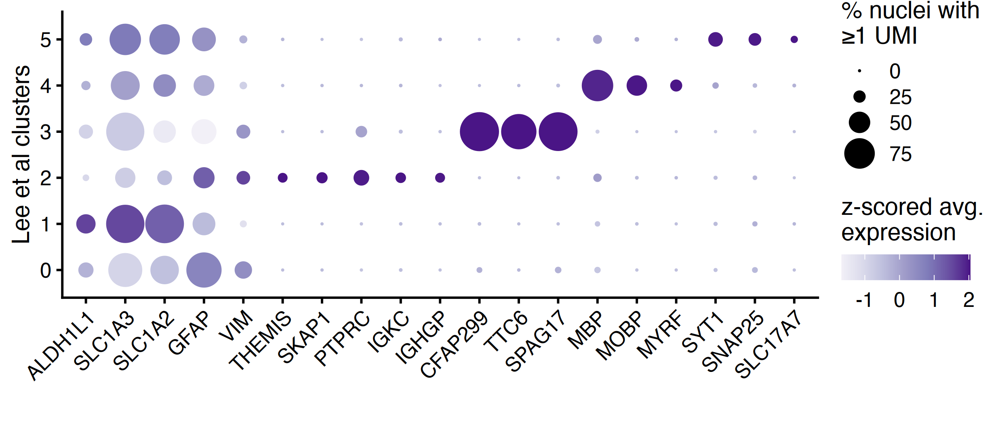

In [35]:
options(repr.plot.width=8.25, repr.plot.height=3.5, repr.plot.res = 300, warn = -1)

cb_human <- NormalizeData(cb_human)
cb_human <- ScaleData(cb_human)

DotPlot(cb_human, features = c('ALDH1L1', 'SLC1A3', 'SLC1A2',
                            'GFAP', 'VIM',
                            'THEMIS', 'SKAP1', 'PTPRC', 'IGKC','IGHGP', 
                            'CFAP299', 'TTC6', 'SPAG17',
                           'MBP', 'MOBP', 'MYRF',
                            'SYT1', 'SNAP25', 'SLC17A7'
                           ), scale = TRUE,
       dot.scale = 10, group.by = 'seurat_clusters') + 
    labs(x = "", y = "Lee et al clusters") + 
    scale_color_distiller(palette = 'Purples', direction = 1) + 
    scale_y_discrete() + 
    guides(color = guide_colorbar(title = 'z-scored avg.\nexpression', 
                                  direction = "horizontal", title.position = "top"),
          size = guide_legend(title = "% nuclei with\n≥1 UMI")) + 
    theme(axis.text.x = element_text(angle = 45, hjust=1, face = 'italic'))

options(warn=0)

We'll next evalute whether Cluster 2, the cluster labeled by Lee et al as the epigenetic memory astrocytes, is composed of multiple subclusters, perhaps containing some non-astrocyte cell types which would explain the T cell and B cell marker gene expression.

In [36]:
Idents(cb_human) <- cb_human$seurat_clusters
cb_memory_astrocytes <- cb_human[,WhichCells(cb_human, idents = '2')]
cb_memory_astrocytes <- FindVariableFeatures(cb_memory_astrocytes, nfeatures = 2000, selection.method = 'dispersion')
cb_memory_astrocytes <- ScaleData(cb_memory_astrocytes)
cb_memory_astrocytes <- RunPCA(cb_memory_astrocytes)

Finding variable features for layer data

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”
PC_ 1 
Positive:  B2M, PTPRC, ARHGAP15, RPS28, HLA-B, RUNX1, RPL13A, SKAP1, HLA-A, RPS19 
	   MBNL1, ANKRD44, PRKCH, HLA-C, IFNG-AS1, RPS27, RPLP2, THEMIS, IKZF1, TMSB4X 
	   RPL28, SLFN12L, ETS1, RABGAP1L, RPL13, IKZF3, RPS27A, SYNE2, CYTIP, IQGAP2 
Negative:  NPAS3, CTNND2, NRG3, LSAMP, GPM6A, SORBS1, DPP10, NEBL, DTNA, LRP1B 
	   DST, PARD3, GLIS3, CLU, CTNNA2, CPE, ADCY2, MIR99AHG, SLC1A2, PRKG1 
	   LINC03051, MAPK10, SLC1A3, FMN2, SPARCL1, NTRK2, NTM, ANK2, NAV3, ADGRV1 
PC_ 2 
Positive:  IGHG3, IGHG1, IGHGP, IGKC, HERPUD1, MZB1, POU2AF1, FCRL5, CREB3L2, DCC 
	   CFAP54, JCHAIN, RPL37A, RPLP1, ENSG00000284999, IGHG2, CEP128, CD79A, SMAP2, RPL10 
	   SLC38A4-AS1, MTDH, RPS23, RPS14, RPL34, IFNG-AS1, RPS8, TPT1, IGHM, ESR1 
Negative:  PRKCH, FYB1, THEMIS, PTPRC, FYN, CD96, ETS1, CD247, GRAP2, SKAP1 
	   PYHIN1, AOAH,

We next integrate the remaining cells using [Harmony (Korsunsky et al 2019; PMID: 31740819)](https://pmc.ncbi.nlm.nih.gov/articles/PMC6884693/) to reduce sample and dataset batch effects.

In [37]:
cb_memory_astrocytes <- RunHarmony(cb_memory_astrocytes, group.by.vars = c('samplenumb', 'Dataset'))
cb_memory_astrocytes <- ProjectDim(cb_memory_astrocytes, reduction = 'harmony', dims.print = 1:10)

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations



harmony_ 1 
Positive:  B2M, PTPRC, ARHGAP15, HLA-B, RPS28, SKAP1, RUNX1, RPL13A, HLA-A, RPS19 
	   PRKCH, MBNL1, ANKRD44, THEMIS, ETS1, HLA-C, SLFN12L, RPLP2, RPS27, IFNG-AS1 
Negative:  NPAS3, CTNND2, NRG3, LSAMP, DTNA, GPM6A, DPP10, SORBS1, NEBL, DST 
	   LRP1B, PARD3, CTNNA2, GLIS3, MIR99AHG, ADCY2, CLU, CPE, SLC1A2, PRKG1 
harmony_ 2 
Positive:  IGHG3, IGHG1, IGHGP, IGKC, MZB1, HERPUD1, POU2AF1, FCRL5, CREB3L2, JCHAIN 
	   DCC, CFAP54, ENSG00000284999, IGHG2, CEP128, CD79A, SMAP2, MTDH, RPLP1, RPL37A 
Negative:  PRKCH, THEMIS, PTPRC, CD96, FYB1, ETS1, FYN, CD247, AOAH, GRAP2 
	   SKAP1, CD2, PARP8, MBNL1, TC2N, NKG7, ARHGAP15, CBLB, CCL5, SLFN12L 
harmony_ 3 
Positive:  MALAT1, PITPNC1, FYN, PRKCH, SKAP1, ETS1, CD2, HSP90AA1, PYHIN1, THEMIS 
	   KLF12, CD247, CD3E, NKG7, DPP10, MACF1, CLU, LINC01934, HLA-A, RORA 
Negative:  PLXDC2, TLR2, F13A1, RBM47, CD163, SYK, FMN1, EPB41L2, SLC2A5, MS4A6A 
	   MTSS1, FAM20A, MERTK, ATP8B4, CPM, FCGR2B, MEF2A, ARHGAP24, LNCAROD, IRAK3 
harmony_ 

We note that several of the Harmony-corrected principal component feature loadings appear to show T cell marker genes, B cell marker genes, and macrophage marker genes. 

We next create an elbow plot to help us choose how many principal components to use when creating a nearest neighbors graph. 

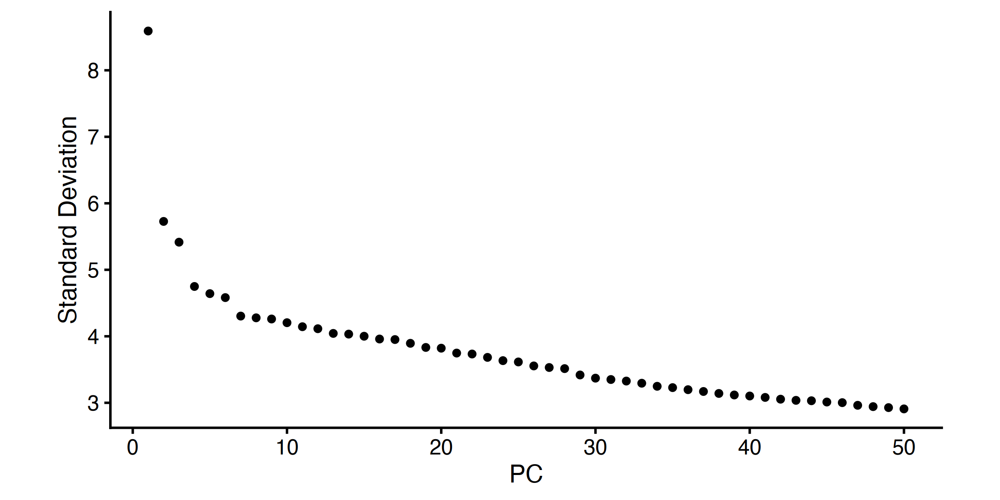

In [38]:
options(repr.plot.width=8, repr.plot.height=4, repr.plot.res = 300)
ElbowPlot(cb_memory_astrocytes, ndims = 50) + theme(aspect.ratio = 0.5)

It appears the vast majority of variation in the dataset is captured in the first several principal components. We chose to proceed using 10 principal components, creating the nearest neighbors graph, clustering the remaining cells, 

In [39]:
cb_memory_astrocytes <- FindNeighbors(cb_memory_astrocytes, reduction = 'harmony', dims = 1:10)
cb_memory_astrocytes <- FindClusters(cb_memory_astrocytes, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 292
Number of edges: 8516

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8302
Number of communities: 5
Elapsed time: 0 seconds


Our clustering identifies 5 clusters, which appear reasonably distinct in PCA space:

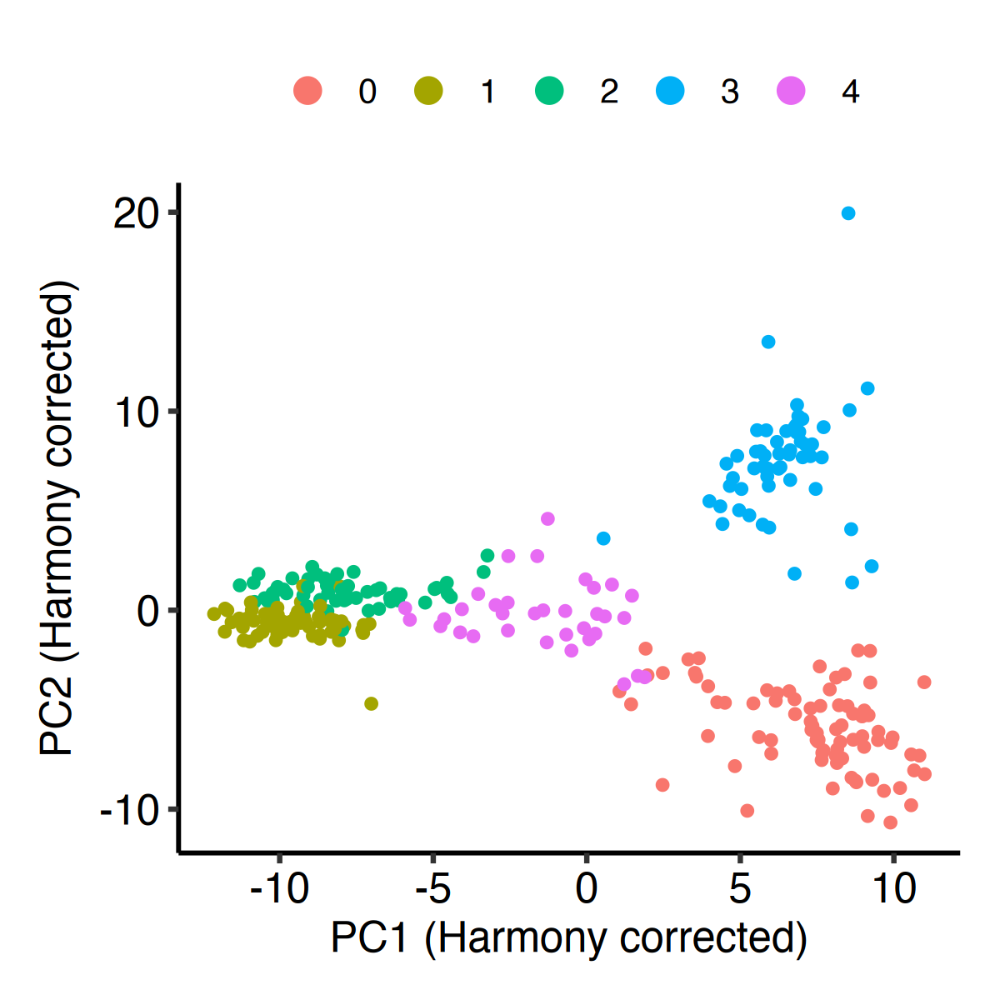

In [40]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)

DimPlot(cb_memory_astrocytes, reduction = 'harmony', dims = 1:2) + 
    labs(x = "PC1 (Harmony corrected)", y = "PC2 (Harmony corrected)") + 
    theme(aspect.ratio = 1) + theme_pubr()

We can also visualize these clusters in two dimensional space using UMAP.

In [41]:
cb_memory_astrocytes = RunUMAP(cb_memory_astrocytes, reduction = 'harmony', dims = 1:10)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
09:15:43 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:15:43 Read 292 rows and found 10 numeric columns

09:15:43 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:15:43 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:15:43 Writing NN index file to te

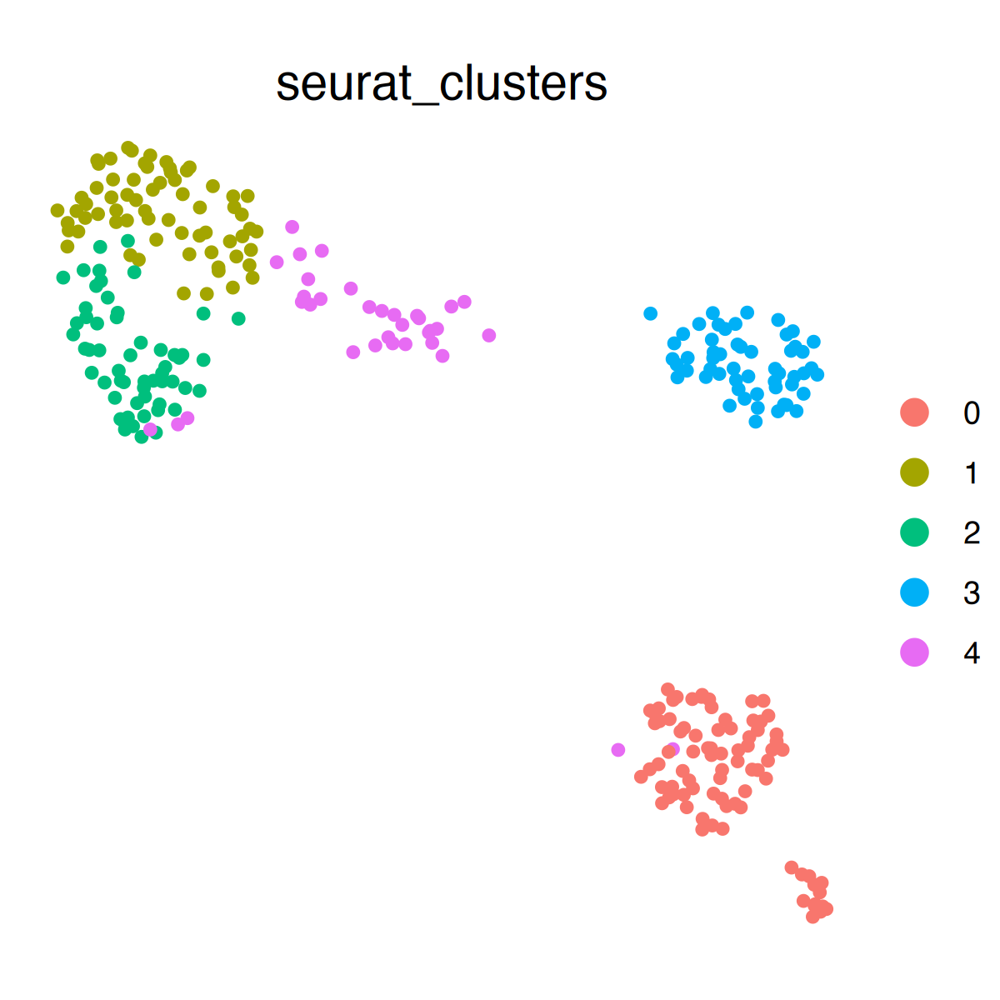

In [42]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)

DimPlot(cb_memory_astrocytes, group.by = "seurat_clusters") + 
    theme_void() + 
    theme(aspect.ratio = 1, plot.title = element_text(face = "bold", hjust = 0.5, size = 14))

We'll now rename our clusters to help distinguish them from the original clusters defined by Lee et al.

In [43]:
Idents(cb_memory_astrocytes) <- cb_memory_astrocytes$seurat_clusters
cb_memory_astrocytes <- RenameIdents(cb_memory_astrocytes, '0' = 'C', '1' = 'A', '2' = 'B', '3' = 'D', '4' = 'E')
Idents(cb_memory_astrocytes) <- factor(Idents(cb_memory_astrocytes), levels = c("A", 'B', 'C', 'D', 'E'))

Now we'll examine what marker genes define each cluster. For this, we'll use the `wilcoxauc` function from the `presto` package to run a fast implementation of the Wilcoxon rank-sum test. Based on [recent work (Moses et al 2023, PMID: 37645732)](https://www.biorxiv.org/content/10.1101/2023.07.20.549945v2) comparing the formulas used to calculate log2-fold changes between Seurat, Scanpy, and other packages, we chose to use the formula from the Scanpy package instead of the one from Seurat.

In [44]:
# geometric mean with static pseudocount (Scanpy log2FC formula)
mean.fxn_geo <- function(x) {
    return(log(x = (expm1(rowMeans(x = x)) + 1e-9), base = 2))
}

# create an empty list for comparing FoldChange calculation results across all clusters
presto_results <- data.frame()

for(i in levels(Idents(cb_memory_astrocytes))){ # loop through all clusters
    
    print(paste0("Calculating markers for cluster ", i))
    
    data <- GetAssayData(object = cb_memory_astrocytes[['RNA']], layer = "data")
    
    # get cell names for groupings (from differential_expression.R line 1701-1749 [https://github.com/satijalab/seurat/blob/master/R/differential_expression.R#L1701])
    IdentsToCells <- function(
      object,
      ident.1,
      ident.2,
      cellnames.use
    ) {
      #
      if (is.null(x = ident.1)) {
        stop("Please provide ident.1")
      } 
      if (length(x = as.vector(x = ident.1)) > 1 &&
          any(as.character(x = ident.1) %in% cellnames.use)) {
        bad.cells <- cellnames.use[which(x = !as.character(x = ident.1) %in% cellnames.use)]
        if (length(x = bad.cells) > 0) {
          stop(paste0("The following cell names provided to ident.1 are not present in the object: ", paste(bad.cells, collapse = ", ")))
        }
      } else {
        ident.1 <- WhichCells(object = object, idents = ident.1)
      }
      # if NULL for ident.2, use all other cells
      if (length(x = as.vector(x = ident.2)) > 1 &&
          any(as.character(x = ident.2) %in% cellnames.use)) {
        bad.cells <- cellnames.use[which(!as.character(x = ident.2) %in% cellnames.use)]
        if (length(x = bad.cells) > 0) {
          stop(paste0("The following cell names provided to ident.2 are not present in the object: ", paste(bad.cells, collapse = ", ")))
        }
      } else {
        if (is.null(x = ident.2)) {
          ident.2 <- setdiff(x = cellnames.use, y = ident.1)
        } else {
          ident.2 <- WhichCells(object = object, idents = ident.2)
        }
      }
      return(list(cells.1 = ident.1, cells.2 = ident.2))
    }
    
    # extract cell lists using IdentsToCells function
    cells <- IdentsToCells(object = cb_memory_astrocytes, ident.1 = i, ident.2 = NULL, 
                           cellnames.use = colnames(cb_memory_astrocytes))
    cells.1 <- cells$cells.1
    cells.2 <- cells$cells.2

    # order data matrix by group
    data <- data[, c(cells.1, cells.2), drop = FALSE]

    # calculate Scanpy fold change
    data.1 <- mean.fxn_geo(data[, cells.1, drop = FALSE])
    data.2 <- mean.fxn_geo(data[, cells.2, drop = FALSE])
    fc_geo <- (data.1 - data.2)

    # get group labels
    group.info <- data.frame(row.names = c(cells.1, cells.2))
    group.info[cells.1, "group"] <- "Group1"
    group.info[cells.2, "group"] <- "Group2"
    group.info[, "group"] <- factor(x = group.info[, "group"])

    # run presto wilcoxon test
    res <- presto::wilcoxauc(X = data, y = group.info[, "group"])
    res <- res[1:(nrow(x = res)/2),]
    res$cluster <- i
    res$log2FC = fc_geo
    
    res$padj <- NULL
    res$logFC <- NULL
    res$group <- NULL
    
    res$p_val_adj = p.adjust(
      p =res$pval,
      method = "bonferroni",
      n = nrow(data)
    )
    
    presto_results <- rbind(presto_results, res)

}
# replace zero p-values with more accurate minimum value representable
presto_results = presto_results %>% mutate(p_val_adj = ifelse(p_val_adj == 0, .Machine$double.xmin, p_val_adj))

[1] "Calculating markers for cluster A"
[1] "Calculating markers for cluster B"
[1] "Calculating markers for cluster C"
[1] "Calculating markers for cluster D"
[1] "Calculating markers for cluster E"


Now save the marker genes data frame as a CSV:

In [45]:
write.table(presto_results %>% filter(abs(log2FC) > 1) %>% filter(p_val_adj < 0.05) %>% arrange(cluster, p_val_adj, desc(log2FC)), 
            'outputs/human_cluster2_subclusters_de_test_results.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

Let's visualize our final subclusters in PCA space:

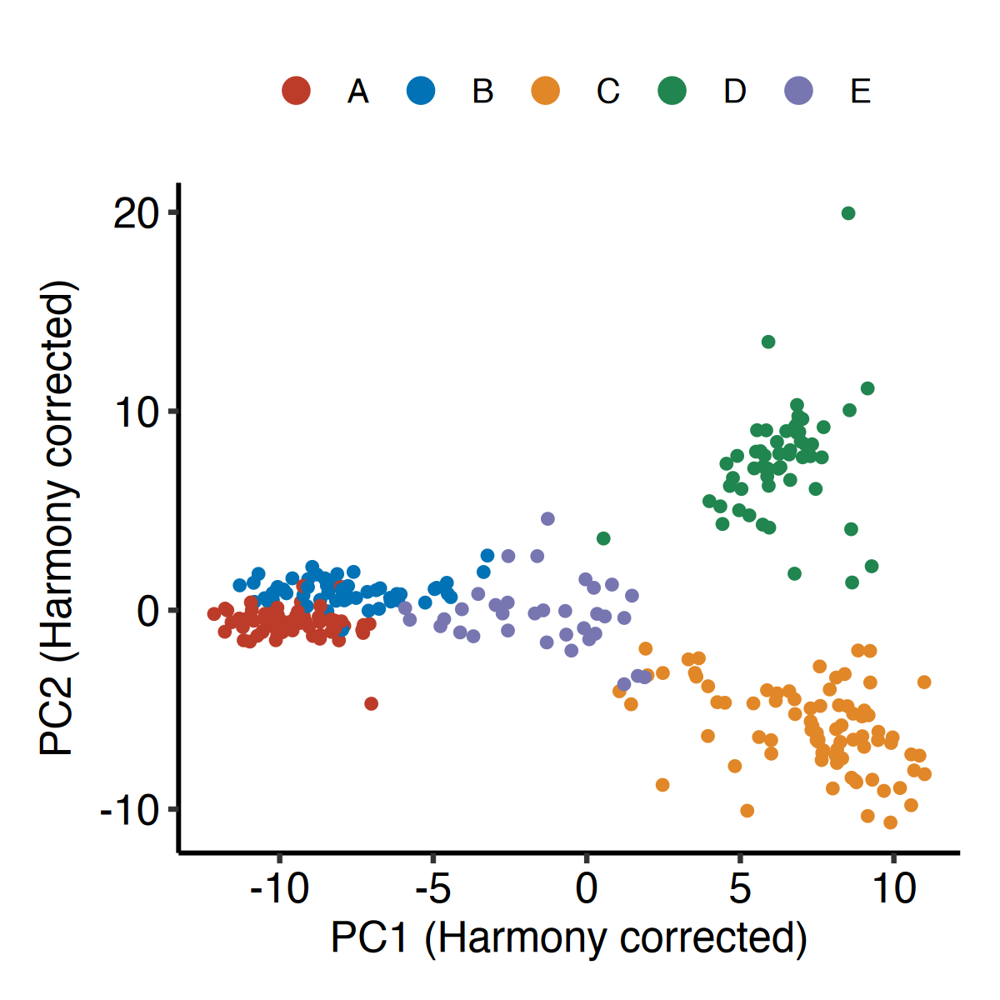

In [46]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)

image = DimPlot(cb_memory_astrocytes, reduction = 'harmony', dims = 1:2) + 
    scale_color_nejm() + 
    labs(x = "PC1 (Harmony corrected)", y = "PC2 (Harmony corrected)") + 
    theme(aspect.ratio = 1) + theme_pubr()

ggsave(file="outputs/figures/extendeddatafigure2c.svg", plot=image, width=4, height=4)

image

And in two dimension with UMAP:

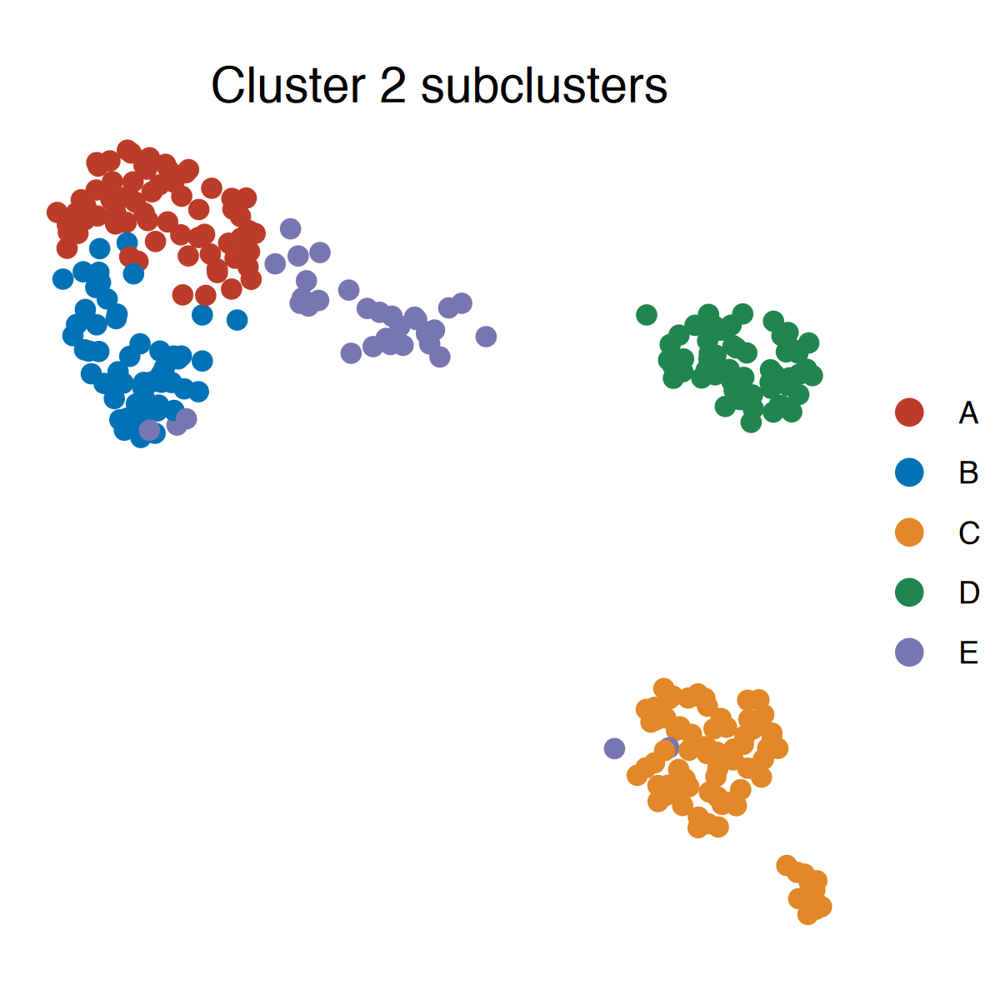

In [47]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)

image = DimPlot(cb_memory_astrocytes, pt.size = 2) + 
    scale_color_nejm() + 
    theme_void() + 
    labs(title = 'Cluster 2 subclusters') + 
    theme(aspect.ratio = 1, plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/figure3h.svg", plot=image, width=4, height=4)

image

If we plot a dot plot of select marker genes for each cluster, we can see subcluster A appears to be bona fide astrocytes, while the remaining clusters are marked by expression of non-astrocyte genes.

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


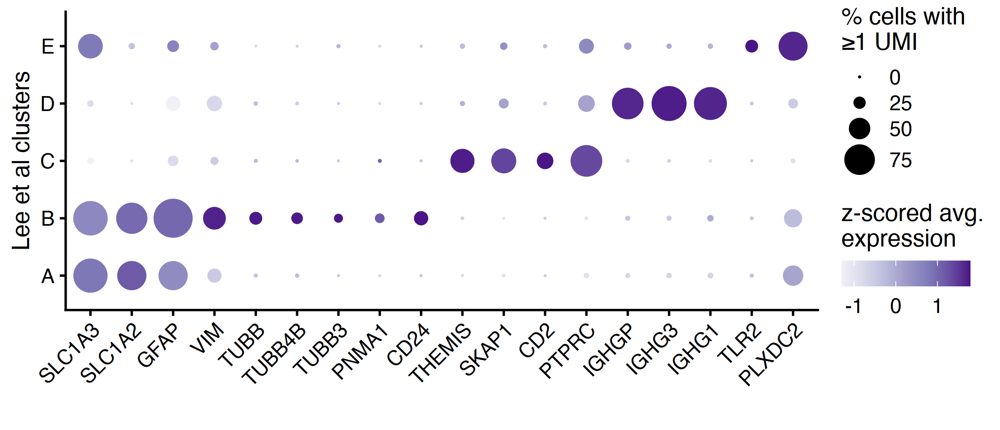

In [48]:
options(repr.plot.width=8.25, repr.plot.height=3.55, repr.plot.res = 300, warn = -1)
image <- DotPlot(cb_memory_astrocytes, features = c('SLC1A3', 'SLC1A2',
                            'GFAP', 'VIM',
                            'TUBB', 'TUBB4B', 'TUBB3','PNMA1', 'CD24',
                                           'THEMIS', 'SKAP1', 'CD2', 'PTPRC', 
                        
                                           'IGHGP','IGHG3', 'IGHG1',
                                           'TLR2', 'PLXDC2'
                           ), scale = TRUE,
       dot.scale = 10) + 
    labs(x = "", y = "Lee et al clusters", color = "avg. z-score\nexpression") + scale_color_distiller(palette = 'Purples', direction = 1) + 
    scale_y_discrete() + 
    guides(color = guide_colorbar(title = 'z-scored avg.\nexpression', direction = "horizontal", title.position = "top"),
          size = guide_legend(title = "% cells with\n≥1 UMI")) + 
    theme(axis.text.x = element_text(angle = 45, hjust=1, face = 'italic'))

ggsave(file="outputs/figures/figure3i.svg", plot=image, width=8.25, height=3.55, dpi = 600)

image

options(warn = 0)

Now we exclude the contaminant subclusters from Cluster 2, retaining only the bona fide astrocytes.

In [49]:
memory_astrocytes <- WhichCells(cb_memory_astrocytes, idents = 'A')
cb_human <- cb_human[, c(memory_astrocytes, WhichCells(cb_human, idents = c('0', '1', '3', '4', '5')))]
print("Number of nuclei in each cluster after removal of contaminants:")
Idents(cb_human) = factor(Idents(cb_human), levels = c('0', '1', '2', '3', '4', '5'))
print(table(Idents(cb_human)))

[1] "Number of nuclei in each cluster after removal of contaminants:"

   0    1    2    3    4    5 
5183 5600   66  695  156  195 


Now we re-calculate enrichment scores for the memory astrocyte gene signatures with the remaining cells. This is necessary because the [scores derived from AddModuleScore are affected by dataset composition]().

In [50]:
#human_up_signature <- readRDS('outputs/human_up_signature.rds')
human_corrected_up_signature <- readRDS('outputs/human_corrected_up_signature.rds')
findseq_human <- readRDS('outputs/human_findseq_signature.rds')

cb_human <- AddModuleScore(cb_human, features = list(human_corrected_up_signature, findseq_human), name = 'SIGNATURE')
score_df = cb_human@meta.data[, c('SIGNATURE1', 'SIGNATURE2', 'seurat_clusters')]

Plot the enrichment scores across clusters for the FIND-seq gene signature:

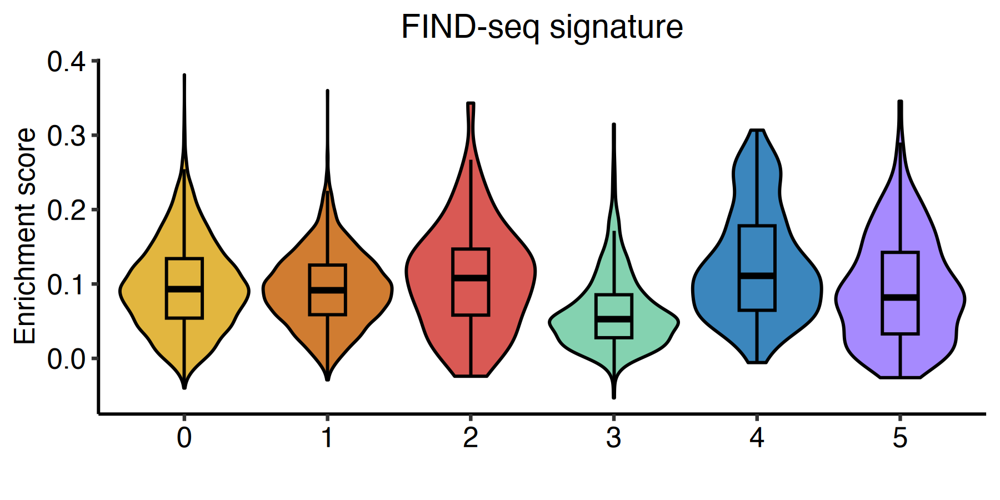

In [51]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df, aes(x = seurat_clusters, y = SIGNATURE2)) + 
    geom_violin(aes(fill = seurat_clusters), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = seurat_clusters), color = 'black', outlier.shape = NA, width = 0.25) + 
    scale_fill_manual(values = c("#e2b63f", "#d07c31", "#d95954",
                                 "#84d2b0",
                                 "#3b86bd", 
                                  "#a68afe"
                                 )) + 
    labs(x = '', y = 'Enrichment score', title = 'FIND-seq signature') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/figure3j.svg", plot=image, width=6, height=3, dpi = 600)

image

The FIND-seq gene signature does not appear particularly enriched in Cluster 2. We can compare this with a Wilcoxon rank-sum test:

In [52]:
signature2_results <- data.frame('comparison' = c(), 'stat' = c(), 'estimate' = c(), 'conf_lower' = c(), 'conf_upper' = c(), 'pval' = c())

for(i in c('0', '1', '3', '4', '5')){
    wilx_res =  wilcox.test(cb_human[,WhichCells(cb_human, idents = '2')]$SIGNATURE2, 
            cb_human[,WhichCells(cb_human, idents = i)]$SIGNATURE2, 
            conf.int = TRUE, 
            exact = FALSE)  

    tmp = data.frame('comparison' = paste0('Cluster 2 vs ', i), 'stat' = wilx_res$statistic, 
                     'estimate' = wilx_res$estimate, 'conf_lower' = wilx_res$conf.int[1], 'conf_upper' = wilx_res$conf.int[2], 
                     'pval' = wilx_res$p.value)

    signature2_results <- rbind(signature2_results, tmp)
}

signature2_results$pval_adj <- p.adjust(signature2_results$pval, method = 'bonferroni')

write.table(signature2_results, 
            'outputs/human_reanalysis_FINDseq_gene_signature_enrichment_wilcoxon_test.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

signature2_results

,comparison,stat,estimate,conf_lower,conf_upper,pval,pval_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
W,Cluster 2 vs 0,184205,0.009107648,-0.007368659,0.025478924,2.818458e-01,1.000000e+00
W1,Cluster 2 vs 1,204928,0.011875269,-0.003414987,0.027242953,1.276377e-01,6.381884e-01
W2,Cluster 2 vs 3,31849,0.044712216,0.028238701,0.060965030,1.763105e-07,8.815527e-07
W3,Cluster 2 vs 4,4502,-0.017540249,-0.037638473,0.005863886,1.400225e-01,7.001127e-01
W4,Cluster 2 vs 5,7236,0.015292299,-0.004469119,0.036766050,1.310123e-01,6.550615e-01


It appears the enrichment of the FIND-seq gene signature is not statistically different between Cluster 2 and the other astrocyte clusters (Clusters 0 & 1), or Clusters 4 & 5, which appear to be oligodendrocyte and neurons. Cluster 2 only exhibits slight elevation of the FIND-seq enrichment score compared to Cluster 3 (ependymal cells).

Now for the Up-signature gene set:

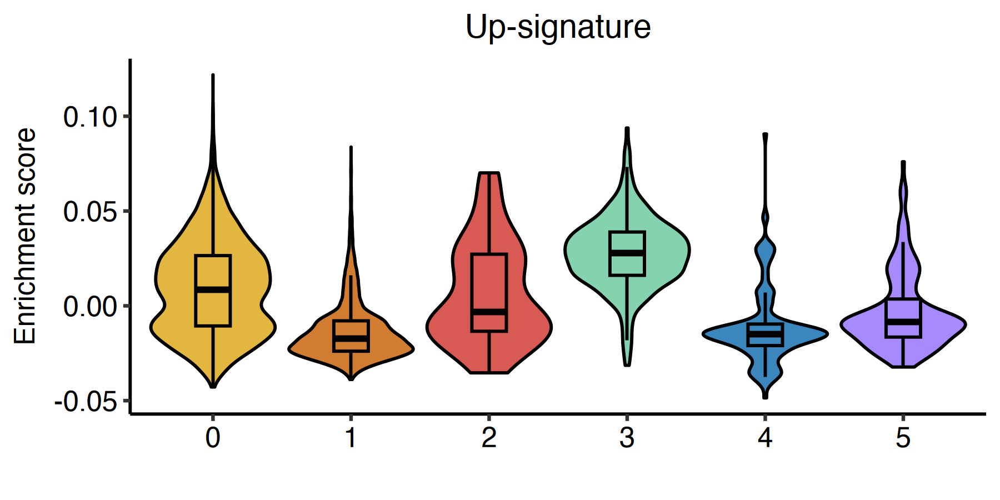

In [53]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df, aes(x = seurat_clusters, y = SIGNATURE1)) + 
    geom_violin(aes(fill = seurat_clusters), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = seurat_clusters), color = 'black', outlier.shape = NA, width = 0.25) + 
    scale_fill_manual(values = c("#e2b63f", "#d07c31", "#d95954",
                                 "#84d2b0",
                                 "#3b86bd", 
                                  "#a68afe"
                                 )) + 
    labs(x = '', y = 'Enrichment score', title = 'Up-signature') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/extendeddatafigure2e.svg", plot=image, width=6, height=3, dpi = 600)

image

In [54]:
signature1_results <- data.frame('comparison' = c(), 'stat' = c(), 'estimate' = c(), 'conf_lower' = c(), 'conf_upper' = c(), 'pval' = c())

for(i in c('0', '1', '3', '4', '5')){
    wilx_res =  wilcox.test(cb_human[,WhichCells(cb_human, idents = '2')]$SIGNATURE1, 
            cb_human[,WhichCells(cb_human, idents = i)]$SIGNATURE1, 
            conf.int = TRUE, 
            exact = FALSE)  

    tmp = data.frame('comparison' = paste0('Cluster 2 vs ', i), 'stat' = wilx_res$statistic, 
                     'estimate' = wilx_res$estimate, 'conf_lower' = wilx_res$conf.int[1], 'conf_upper' = wilx_res$conf.int[2], 
                     'pval' = wilx_res$p.value)

    signature1_results <- rbind(signature1_results, tmp)
}

signature1_results$pval_adj <- p.adjust(signature1_results$pval, method = 'bonferroni')

write.table(signature1_results, 
            'outputs/human_reanalysis_corrected_upsignature_enrichment_wilcoxon_test.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

signature1_results

,comparison,stat,estimate,conf_lower,conf_upper,pval,pval_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
W,Cluster 2 vs 0,157472.5,-0.003514548,-0.010043667,0.002664617,2.674647e-01,1.000000e+00
W1,Cluster 2 vs 1,275719.0,0.015795937,0.011213954,0.021265498,5.911246e-12,2.955623e-11
W2,Cluster 2 vs 3,11937.0,-0.024553021,-0.030635283,-0.017957318,1.165108e-10,5.825540e-10
W3,Cluster 2 vs 4,7394.0,0.014095457,0.008437200,0.022757149,2.843420e-07,1.421710e-06
W4,Cluster 2 vs 5,7796.0,0.006990614,0.001689904,0.013603553,1.027167e-02,5.135833e-02


We note that Cluster 2 also exhibits no difference in the Up-signature enrichment score compared to astrocyte Cluster 0 or neuronal Cluster 5. Cluster 2 also exhibits lower enrichment compared to ependymal Cluster 3.

Let's examine expression of the corrected up-signature genes in a dot plot to emphasize the proportion of cells in each cluster expressing each gene: 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


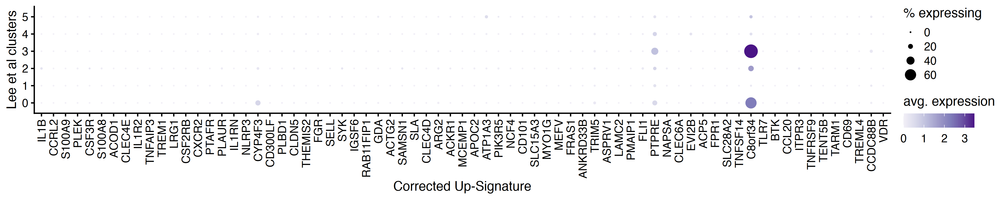

In [55]:
options(repr.plot.width=15, repr.plot.height=3, repr.plot.res = 300, warn = -1)

image = DotPlot(cb_human, features = human_corrected_up_signature, assay = 'RNA', group.by = 'seurat_clusters', scale = FALSE, scale.min = 0, scale.max = 75) + 
    scale_color_distiller(palette = 'Purples', direction = 1, breaks = scales::pretty_breaks(n = 4)) + 
    guides(color = guide_colorbar(title = 'avg. expression', direction = "horizontal", title.position = "top"),
          size = guide_legend(title = "% expressing")) + 
    labs(y = 'Lee et al clusters', x = 'Corrected Up-Signature', color = NULL, size = '% expressing') + 
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, face = 'italic'), legend.justification = "top")

ggsave(file="outputs/figures/extendeddatafigure2f.svg", plot=image, width=15, height=3, dpi = 600)

image

options(warn = 0)

Lastly, given the small number of nuclei remaining in Cluster 2, we examine the number of nuclei per original sample from the Absinta and Schirmer datasets.

In [56]:
samples_df = data.frame('sample' = cb_human$samplenumb, 'dataset' = cb_human$Dataset, 'diagnosis' = cb_human$Diagnosis)
samples_df = samples_df[!duplicated(samples_df),]
rownames(samples_df) <- samples_df$sample
counts_df = as.data.frame(table(cb_human$seurat_clusters, cb_human$samplenumb)[3,])
colnames(counts_df) <- 'counts'
counts_df = merge(samples_df, counts_df, by = 0, all = TRUE)

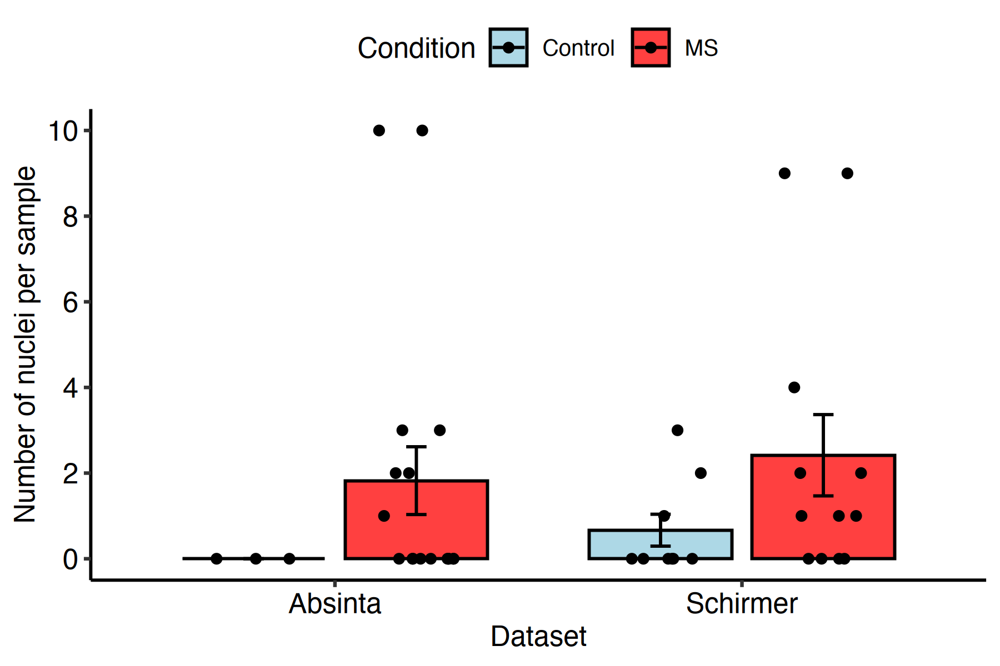

In [57]:
options(repr.plot.width=6, repr.plot.height=4, repr.plot.res = 300)

image = ggbarplot(counts_df %>% mutate(Condition = ifelse(diagnosis %in% c("CTRL", "Control"), "Control", 'MS')), 
       x = 'dataset', y = 'counts', color = 'Condition', fill = 'Condition', 
                 add=c('mean_se', 'jitter'), position = position_dodge(0.8)) + 
    labs(x = 'Dataset', y = 'Number of nuclei per sample', color = 'Condition') + 
    scale_color_manual(values = c('black', 'black')) + 
    scale_fill_manual(values = c('lightblue', 'brown1')) + 
    scale_y_continuous(breaks=scales::pretty_breaks()) + 
    theme_pubr()

ggsave(file="outputs/figures/extendeddatafigure2d.svg", plot=image, width=6, height=3, dpi = 600)

image

Save the renalyzed human Seurat object:

In [58]:
saveRDS(cb_human, 'outputs/combined_human_REANALYSIS_final_seurat_object.rds')

In [59]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-apple-darwin13.4.0 (64-bit)
Running under: macOS Big Sur ... 10.16

Matrix products: default
BLAS/LAPACK: /Users/liddelowlab/mambaforge/envs/EpiMemAstros/lib/libopenblasp-r0.3.28.dylib;  LAPACK version 3.12.0

locale:
[1] en_US.UTF-8/en_US.UTF-8/en_US.UTF-8/C/en_US.UTF-8/en_US.UTF-8

time zone: America/New_York
tzcode source: system (macOS)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] DropletQC_0.0.0.9000        hdf5r_1.3.11               
 [3] ggrastr_1.0.2               cowplot_1.1.3              
 [5] scDblFinder_1.16.0          BiocParallel_1.36.0        
 [7] scater_1.30.1               scuttle_1.12.0             
 [9] SingleCellExperiment_1.24.0 SummarizedExperiment_1.32.0
[11] Biobase_2.62.0              GenomicRanges_1.54.1       
[13] GenomeInfoDb_1.38.1         IRanges_2.36.0             
[15] S4Vectors_0.40.2            BiocGenerics

In [60]:
version

               _                           
platform       x86_64-apple-darwin13.4.0   
arch           x86_64                      
os             darwin13.4.0                
system         x86_64, darwin13.4.0        
status                                     
major          4                           
minor          3.3                         
year           2024                        
month          02                          
day            29                          
svn rev        86002                       
language       R                           
version.string R version 4.3.3 (2024-02-29)
nickname       Angel Food Cake             